# ΨΗΦΙΑΚΗ ΕΠΕΞΕΡΓΑΣΙΑ ΗΧΟΥ 
## ΕΙΣΑΓΩΓΙΚΗ ΑΣΚΗΣΗ - 2019- 2020
**ΑΝΔΡΕΑΣ ΜΠΑΡΔΟΥΤΣΟΣ  
ΔΠΜΣ ΣΜΗΝ  
ΑΜ: 1041125**

Εισαγωγή των απαραίτητων βιβλιοθηκών για διαχείριση σημάτων στην Python. Τέτοιες βιβλιοθήκες είναι οι numpy και scipy.  
Η οπτικοποίηση των δεδομένων θα γίνει με χρήση της βιβλιοθήκης απεικόνισης γραφικών της Python, matplotlib.  
Επιπλέον, δίνεται η δυνατότητα να ακουστούν τα παραγόμενα σήματα με χρήση προσθέτου HTML5 στο παρόν Jupyter notebook.

In [1]:
import datetime
import numpy as np
import scipy as sp
import scipy.fftpack
from scipy import signal
from scipy.signal import butter, lfilter, freqz, filtfilt
from scipy.io import wavfile
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import BoundaryNorm
%pylab inline
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from IPython.core.display import HTML
import IPython.display as ipd

Populating the interactive namespace from numpy and matplotlib


## ΣΚΕΛΟΣ Α'

In [2]:
## some consstant for our audio file 

rate = 44100 #44.1 khz
duration =5 # in sec

normedsin = lambda f,t : 2**13*sin(2*pi*f*t)

time = np.linspace(0,duration, num=rate*duration)

### A.1. sinusoid signal

Δημιουργία σήματος ημιτόνου συχνότητας 500 Hz με διάρκεια 5 sec.

In [3]:
# define a 500 Hz sin function 
S1 = lambda t : normedsin(500,t)

In [4]:
def plot_signal_amplitude(S, rate, figtitle, ax=None, figsize=(10,8), xscale="linear", yscale="linear"):
    time=np.arange(0,len(S))
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    else:
        fig = plt.gcf()
        ax.clear()
    ax.plot(time, S)
    ax.set_xlabel('Time (seconds)')
    ax.set_xscale(xscale)
    ax.set_yscale(yscale)
#     if xscale=="linear":
#     xticks = np.linspace(0, len(S), 6)
#     ax.set_xticks(xticks)
    ticklabels = ax.get_xticks()
    ax.set_xticklabels(["{0:.3f}".format(i/rate) for i in ticklabels])
    ax.set_ylabel('Amplitude')
    ax.set_title(figtitle)
    ax.grid()

In [5]:
def plot_powerspectrum(S, rate, figtitle, ax=None, figsize=(10,8)):
    mySoundLength = len(S)
    # Frequency points or beans are the estimated frequency points on x-axis
    # keep only the first half of the frequencies contained in FFT due to symetry
    numUniquePoints = np.ceil((mySoundLength + 1) / 2.0)
    # Calculate fourier transform of signal S
    fftArray = sp.fft.fft(S)
    fftArray = fftArray[0:int(numUniquePoints)]
    # FFT contains both magnitude and phase and given in complex numbers in real + imaginary 
    # parts (a + ib) format.By taking absolute value , we get only real part.
    fftArray = abs(fftArray)
    #Scale the fft array by length of sample points so that magnitude does not depend on
    # the length of the signal or on its sampling frequency
    fftArray = fftArray / float(mySoundLength)
    # FFT has both positive and negative information. Square to get positive only.
    fftArray = fftArray **2
    #Odd NFFT excludes Nyquist point
    if mySoundLength % 2 > 0: #we've got odd number of points in fft
        fftArray[1:len(fftArray)] = fftArray[1:len(fftArray)] * 2
    else: #We've got even number of points in fft
        fftArray[1:len(fftArray) -1] = fftArray[1:len(fftArray) -1] * 2  
    # split the array containing frequencies in even parts
    freqArray = np.arange(0, numUniquePoints, 1.0) * (rate / mySoundLength)
    #Plot the frequency
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    else:
        ax.clear()
        fig = plt.gcf()
    ax.plot(freqArray/1000, 10 * np.log10 (fftArray[:]), color='Blue')
    ax.set_xlabel('Frequency (Khz)')
    ax.set_xlim([0,5])
    ax.set_ylabel('Power (dB)')
    ax.set_title(figtitle)
    plt.grid()

In [6]:
def plot_specgram_with_stft(S, rate, figtitle, ax=None, upperylimit=5000, cmap="cmap", figsize=(10,8)):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    else:
        ax.clear()
        fig = plt.gcf()
    f, t, Zxx = signal.stft(S, fs=rate)
    # Convert to dB
    ampl = 20*np.log10(np.abs(Zxx))
    levels = MaxNLocator(nbins=15).tick_values(np.amin(ampl), np.amax(ampl))
    # pick the desired colormap, sensible levels, and define a normalization
    # instance which takes data values and translates those into levels.
    cmap = plt.get_cmap('magma')
    norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)
    im = ax.pcolormesh(t, f, ampl, cmap=cmap, norm=norm)
    fig.colorbar(im, ax=ax)
    ax.set_title('STFT on signal')
    ax.set_ylabel('Frequency [Hz]')
    ax.set_ylim([0,upperylimit])
    ax.set_title(figtitle+"\n(plot STFT with matplotlib.pcolormesh)")
    ax.set_xlabel('Time [sec]')

In [7]:
def plot_specgram(S, rate, figtitle, ax=None, upperylimit=3000, cmap="magma"):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    else:
        ax.clear()
        fig = plt.gcf()
    pxx,  freq, t, cax = ax.specgram(S,Fs=rate, cmap=cmap)
    ax.set_ylabel('Frequency [Hz]')
    ax.set_xlabel('Time [sec]')
    ax.set_ylim([0,upperylimit])
    ax.set_title(figtitle+"\n(plot with matplotlib.specgram)")
    fig.colorbar(cax)

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


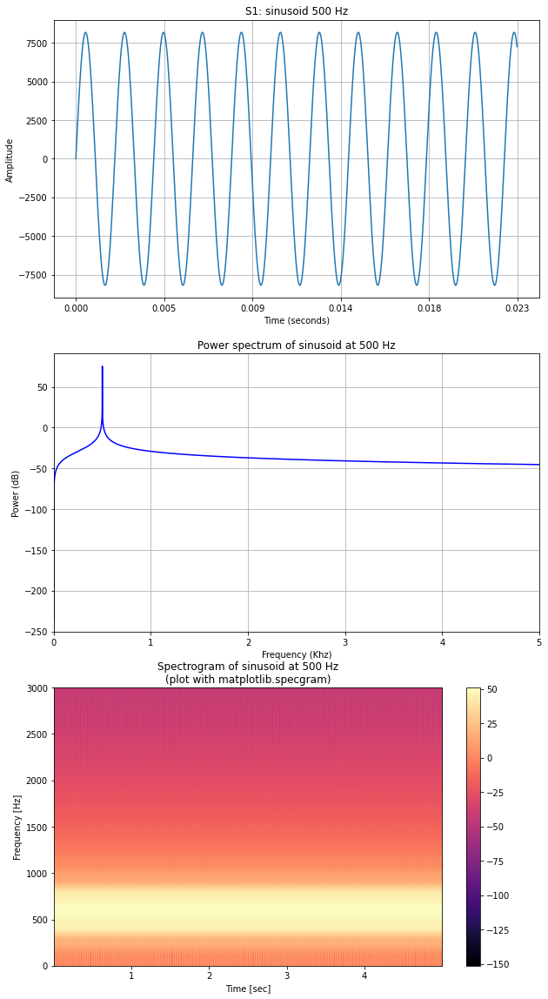

In [8]:
# look at it on the first 25 ms (first 1000 samples)
plt.figure(figsize=(10,20))
plot_signal_amplitude(S1(time)[:1000], rate, "S1: sinusoid 500 Hz", ax=plt.subplot(311))
plot_powerspectrum(S1(time), rate, 'Power spectrum of sinusoid at 500 Hz', ax=plt.subplot(312))
plot_specgram(S1(time), rate, 'Spectrogram of sinusoid at 500 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=S1(time), rate=rate))

### A.2. Sweep signal

Δημιουργία σήματος σάρωσης ημιτόνου (Sweep) στην περιοχή 440Hz - 1320Hz. Για την δημιουργία χρησιμοποιείται η συνάρτηση chirp[[link](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.chirp.html)] της βιβλιοθήκης scipy.

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


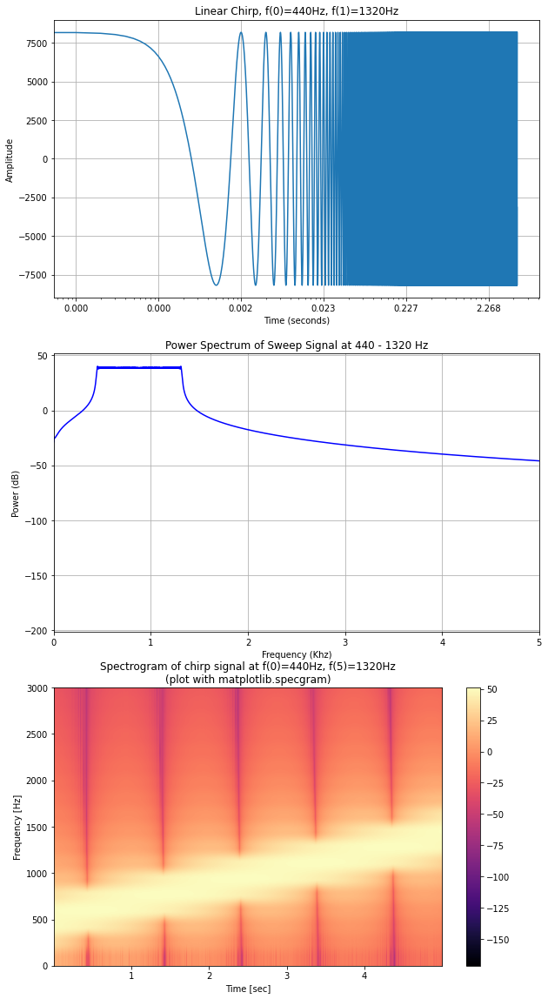

In [9]:
S2 = 2**13*signal.chirp(time, f0=440, f1=1320, t1=duration, method='linear')
plt.figure(figsize=(10,20))
plot_signal_amplitude(S2, rate, "Linear Chirp, f(0)=440Hz, f(1)=1320Hz", ax=plt.subplot(311), xscale="log")
plot_powerspectrum(S2,rate, "Power Spectrum of Sweep Signal at 440 - 1320 Hz", ax=plt.subplot(312))
plot_specgram(S2, rate, 'Spectrogram of chirp signal at f(0)=440Hz, f(5)=1320Hz', ax=plt.subplot(313), cmap="magma")

In [10]:
ipd.display(ipd.Audio(data=S2, rate=rate))

### A.3. Metronome

In [11]:
# BPM sound will have duration 8 seconds to have exactly 16 beats 
# (number of beats if rate is 120 beats per minute)
time_bpm = np.linspace(0,8, num=rate*duration)
# step of beat
step = (rate*duration)// 16
# S3 would be zero except the array positions where a beat occurs
S3 = [0 if i % step else 2**13 for i in range(0,rate*duration)]
S3 = np.array(S3)

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


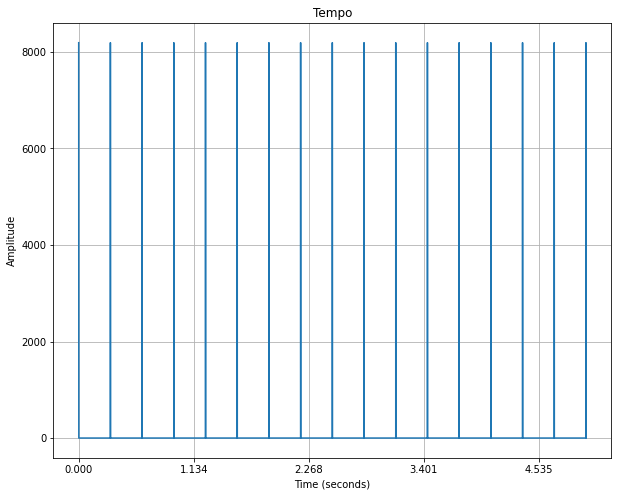

In [12]:
plt.figure(figsize=(10,8))
plot_signal_amplitude(S3, rate, "Tempo", ax=plt.gca())

The audio file `metronome.wav` was generated with audacity.

In [13]:
rate, S3 = wavfile.read("metronome.wav")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  """Entry point for launching an IPython kernel.


/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


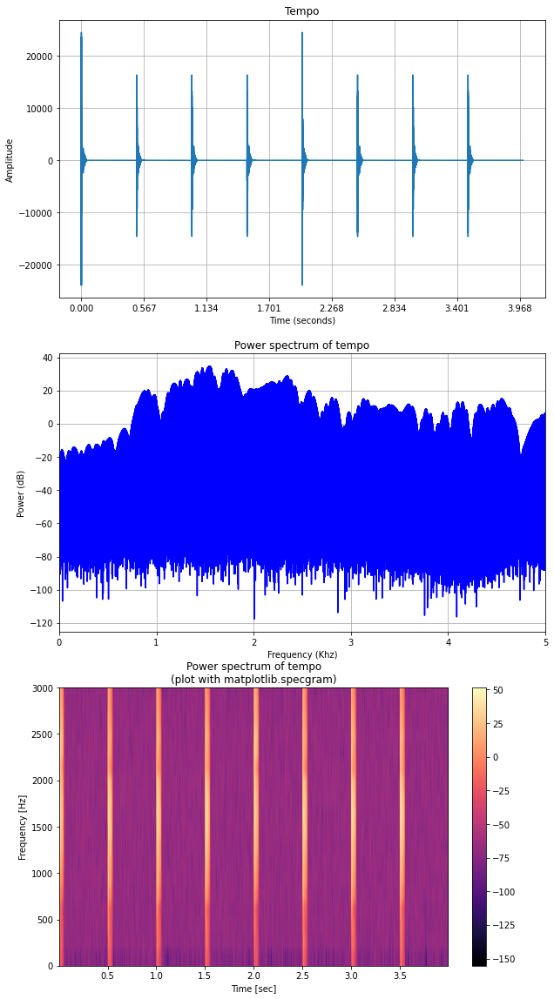

In [14]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(S3, rate, "Tempo", ax=plt.subplot(311))
plot_powerspectrum(S3,rate, 'Power spectrum of tempo', ax=plt.subplot(312))
plot_specgram(S3,rate, 'Power spectrum of tempo', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=S3, rate=rate))

In [15]:
ipd.display(ipd.Audio(data=S3, rate=rate))

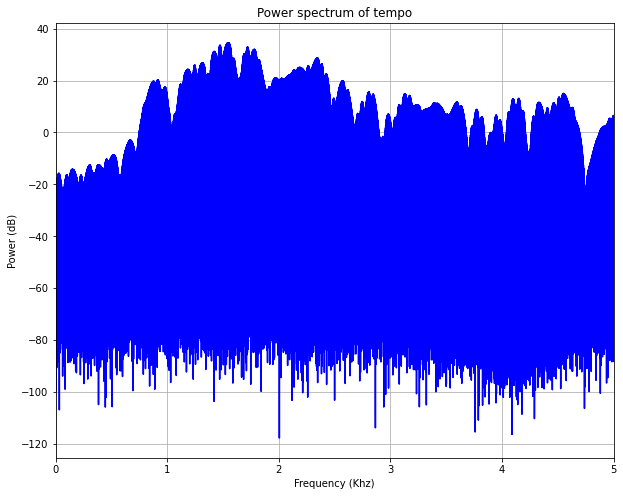

In [16]:
plot_powerspectrum(S3,rate, 'Power spectrum of tempo')

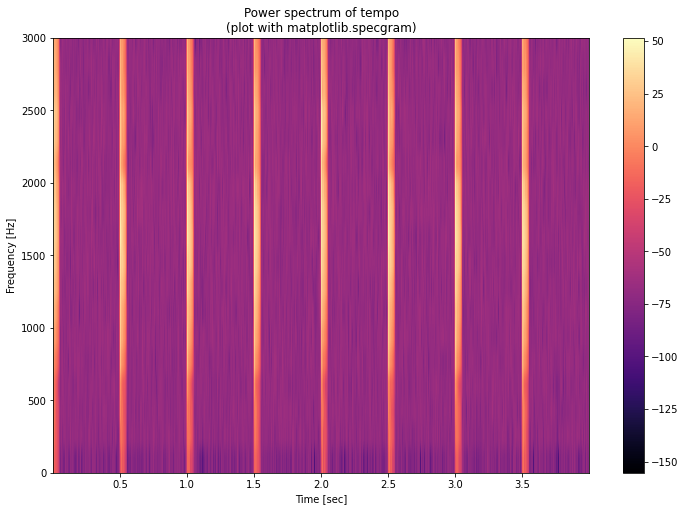

In [17]:
plt.figure(figsize=(12,8))
plot_specgram(S3,rate, 'Power spectrum of tempo', ax=plt.gca())

### A.4. White noise

Ο λευκός θόρυβος ορίζεται ως ένα τυχαίο σήμα με μέση τιμή 0 και τυπική απόκλιση 1.

In [18]:
mean = 0
std = 1
S4 = np.random.normal(mean, std, size=rate*duration)

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


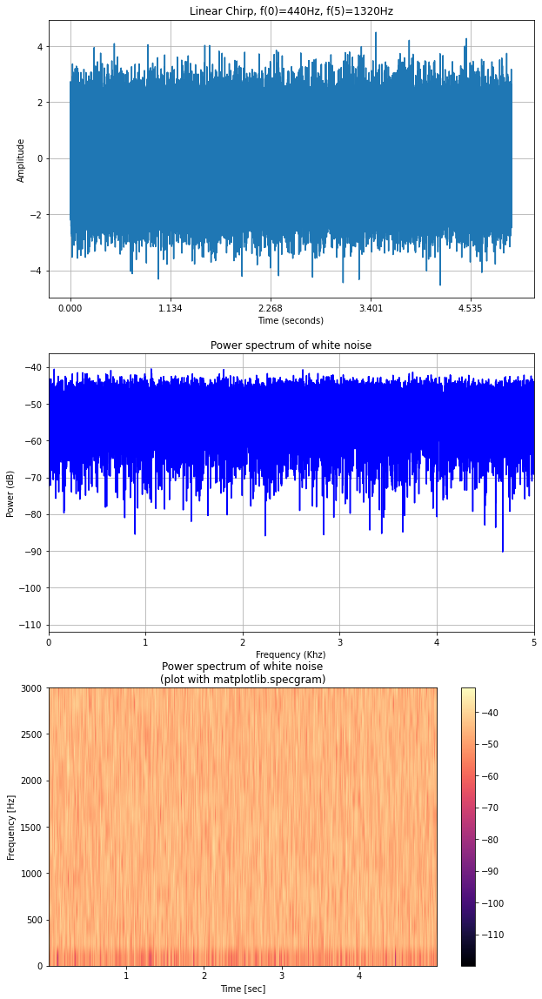

In [19]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(S4, rate, "Linear Chirp, f(0)=440Hz, f(5)=1320Hz", ax=plt.subplot(311))
plot_powerspectrum(S4,rate, 'Power spectrum of white noise', ax=plt.subplot(312))
plot_specgram(S4,rate, 'Power spectrum of white noise', ax=plt.subplot(313))

In [20]:
# write the file on disk, and show in in a Html 5 audio player
wavfile.write('S4.wav', rate, S4.astype(np.int16))
ipd.display(ipd.Audio(data=S4, rate=rate))

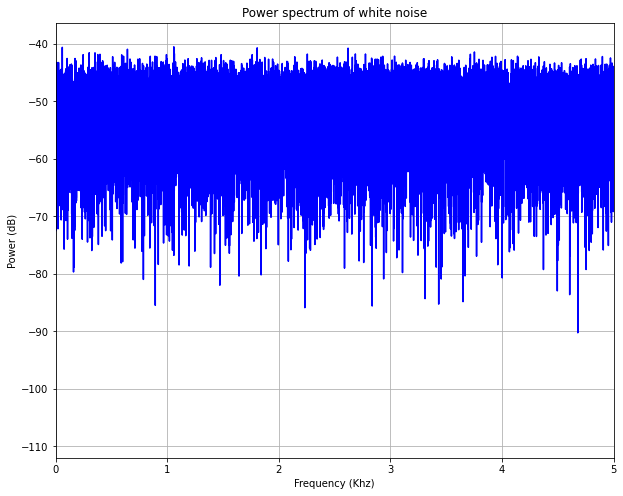

In [21]:
plot_powerspectrum(S4,rate, 'Power spectrum of white noise')

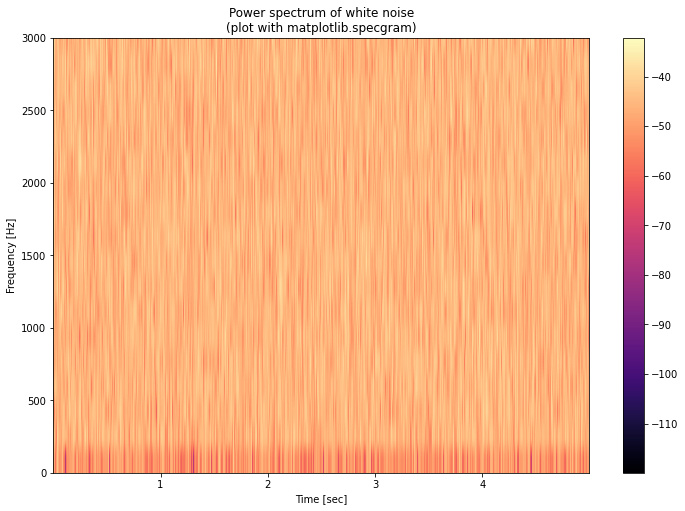

In [22]:
plt.figure(figsize=(12,8))
plot_specgram(S4,rate, 'Power spectrum of white noise', ax=plt.gca())

## ΣΚΕΛΟΣ Β'

Δημιουργία των συναρτήσεων για τα φίλτρα. Για τη δημιουργία των συντελεστών του φίλτρου χρησιμοποιείται η συνάρτηση `signal.butter`. Οι συντελεστές της συνάρτησης εφαρμόζονται πάνω στο δοσμένο σήμα με χρήση της συνάρτησης `signal.filtfilt`. 

In [23]:
def apply_filter_on_signal(S, rate, cutoff, order, btype):
    """
    
    """
    nyq = 0.5 * rate
    if not btype == "band":
        normal_cutoff = np.float(cutoff) / nyq
        b, a = butter(order, normal_cutoff, btype=btype, analog=False)
    else:
        if not isinstance(cutoff, list):
            raise Exception("Bandpass filter requires the edge frequencies to be pased as a list.")
        low = np.float(cutoff[0]) / nyq
        high = np.float(cutoff[1]) / nyq
        b, a = butter(order, [low, high], btype='band')
    y = filtfilt(b, a, S, method='gust')
    return y

### B.1 Εφαρμογή φίλτρων σro σήμα S1

In [24]:
# lowpass filter on signal S1
SL1 = apply_filter_on_signal(S1(time), rate, 500, 4, "low")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


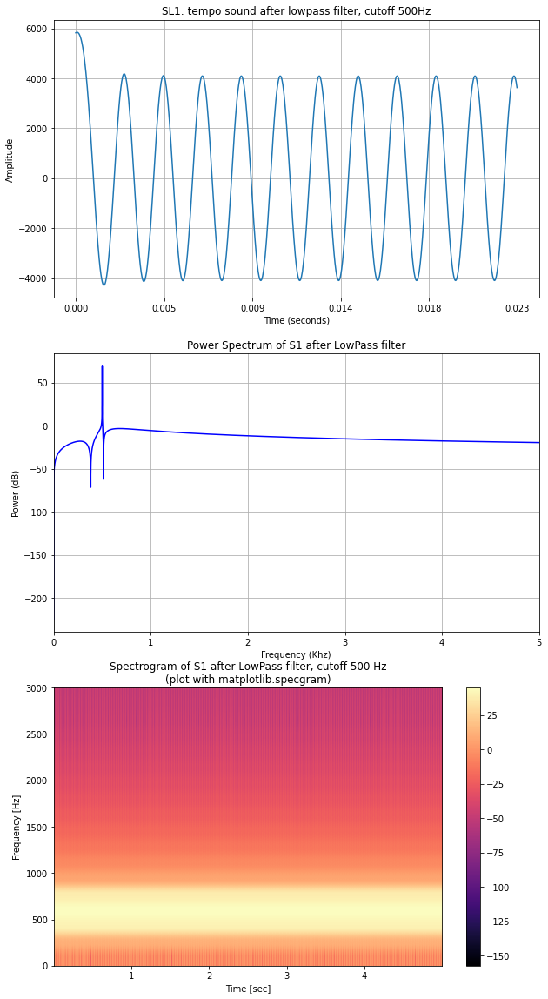

In [25]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SL1[:1000], rate, "SL1: tempo sound after lowpass filter, cutoff 500Hz", ax=plt.subplot(311))
plot_powerspectrum(SL1,rate, "Power Spectrum of S1 after LowPass filter", ax=plt.subplot(312))
plot_specgram(SL1, rate, 'Spectrogram of S1 after LowPass filter, cutoff 500 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SL1, rate=rate))

In [26]:
# bandpass filter on signal S1
SB1 = apply_filter_on_signal(S1(time),rate, [500, 1000], 4, "band")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


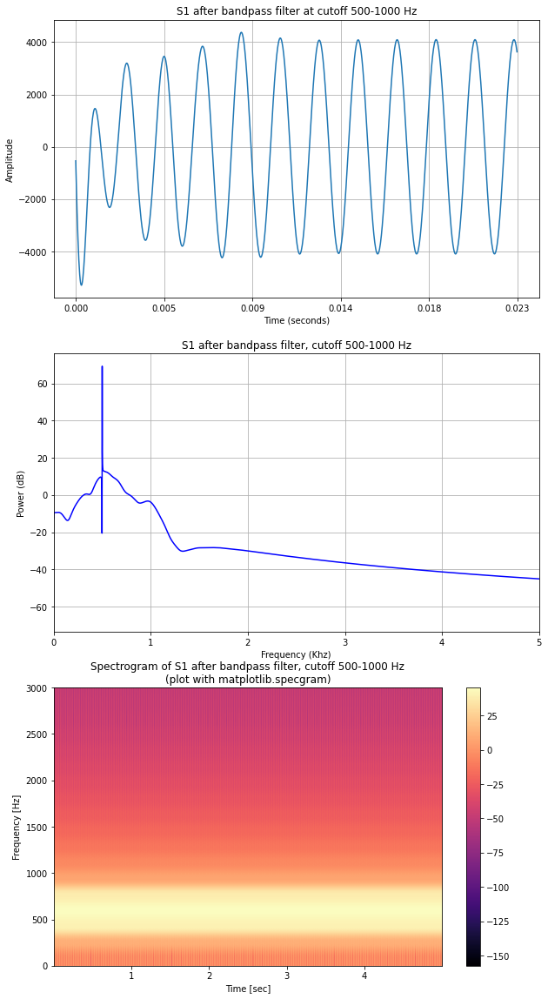

In [27]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SB1[:1000], rate, "S1 after bandpass filter at cutoff 500-1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SB1,rate, "S1 after bandpass filter, cutoff 500-1000 Hz", ax=plt.subplot(312))
plot_specgram(SB1, rate, 'Spectrogram of S1 after bandpass filter, cutoff 500-1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SB1, rate=rate))

In [28]:
# highpass filter on signal S1
SH1 = apply_filter_on_signal(S1(time), rate, 1000, 4, "high")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


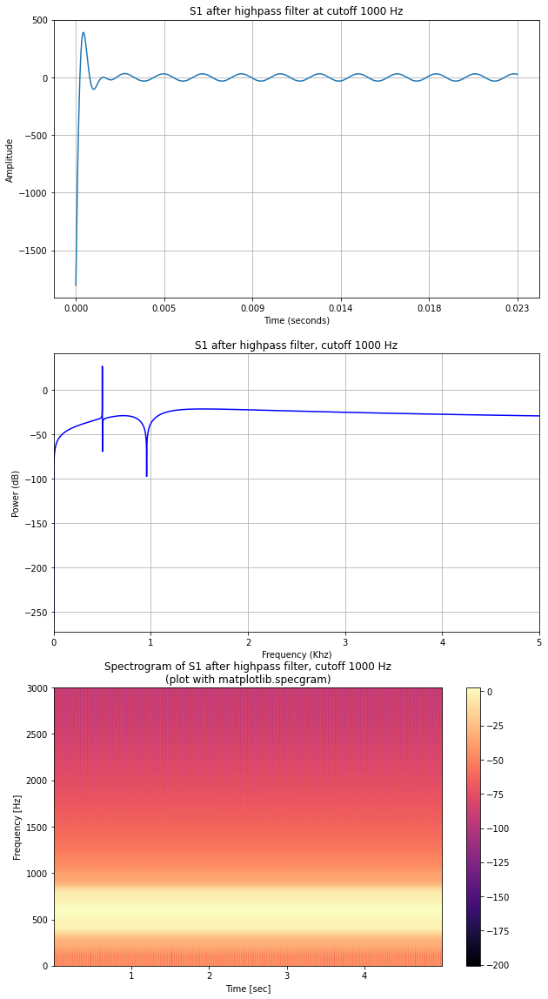

In [29]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SH1[:1000], rate, "S1 after highpass filter at cutoff 1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SH1,rate, "S1 after highpass filter, cutoff 1000 Hz", ax=plt.subplot(312))
plot_specgram(SH1, rate, 'Spectrogram of S1 after highpass filter, cutoff 1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SH1, rate=rate))

### B.2. Εφαρμογή των φίλτρων στο σήμα S2

In [30]:
# lowpass filter on signal 2
SL2 = apply_filter_on_signal(S2, rate, 500, 4, "low")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


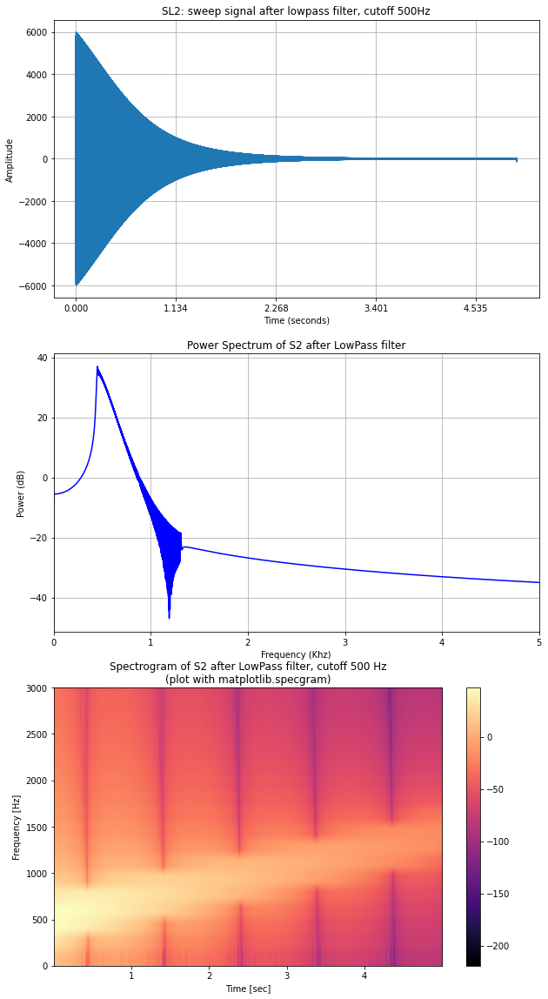

In [31]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SL2, rate, "SL2: sweep signal after lowpass filter, cutoff 500Hz", ax=plt.subplot(311))
plot_powerspectrum(SL2,rate, "Power Spectrum of S2 after LowPass filter", ax=plt.subplot(312))
plot_specgram(SL2, rate, 'Spectrogram of S2 after LowPass filter, cutoff 500 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SL2, rate=rate))

In [32]:
# bandpass filter on signal S2
SB2 = apply_filter_on_signal(S2,rate, [500, 1000], 4, "band")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


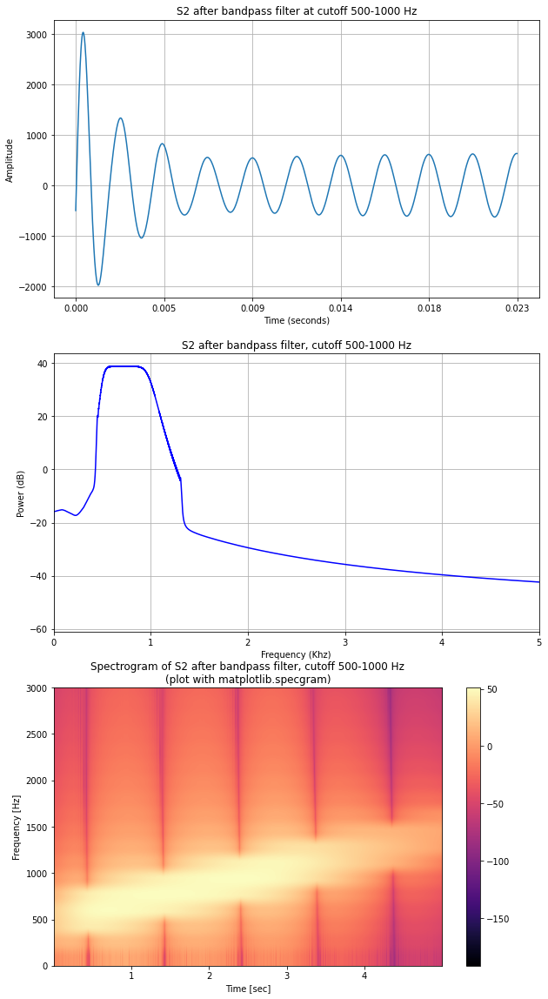

In [33]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SB2[:1000], rate, "S2 after bandpass filter at cutoff 500-1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SB2,rate, "S2 after bandpass filter, cutoff 500-1000 Hz", ax=plt.subplot(312))
plot_specgram(SB2, rate, 'Spectrogram of S2 after bandpass filter, cutoff 500-1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SB2, rate=rate))

In [34]:
# Highpass filter on signal S2
SH2 = apply_filter_on_signal(S2,rate, 1000, 4, "high")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


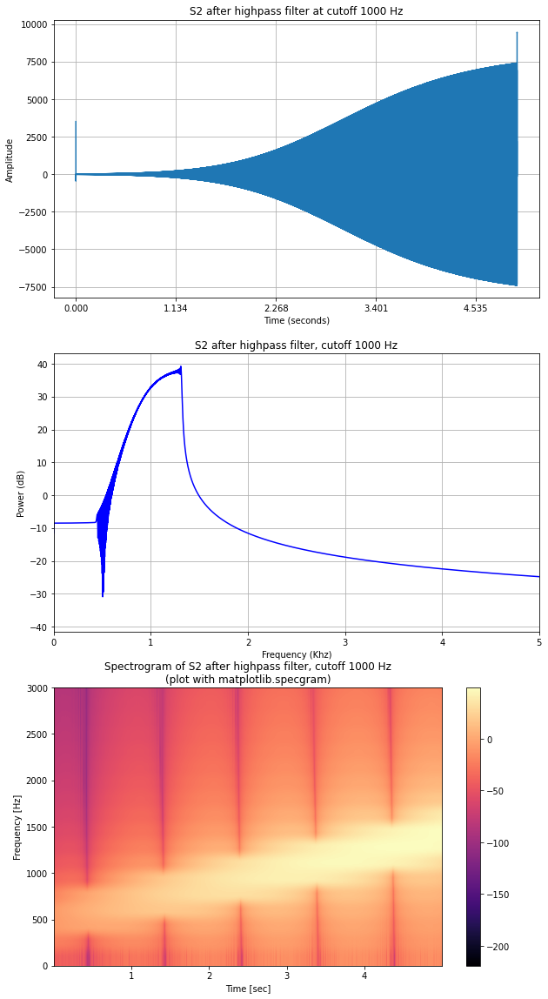

In [35]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SH2, rate, "S2 after highpass filter at cutoff 1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SH2,rate, "S2 after highpass filter, cutoff 1000 Hz", ax=plt.subplot(312))
plot_specgram(SH2, rate, 'Spectrogram of S2 after highpass filter, cutoff 1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SH2, rate=rate))

### B.4. Εφαρμογή των φίλτρων στο σήμα S3

In [36]:
# lowpass filter on signal S3
SL3 = apply_filter_on_signal(S3, rate, 500, 4, "low")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


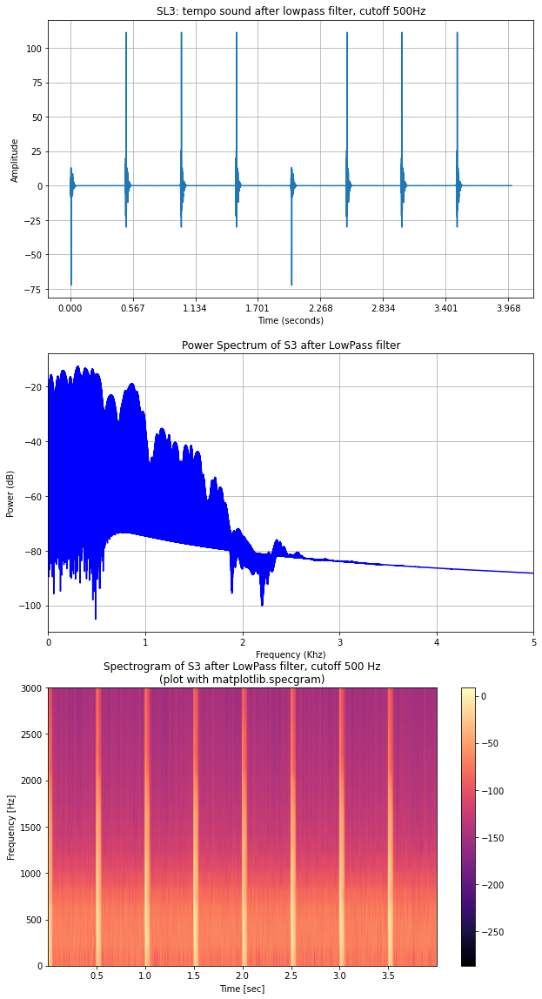

In [37]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SL3, rate, "SL3: tempo sound after lowpass filter, cutoff 500Hz", ax=plt.subplot(311))
plot_powerspectrum(SL3,rate, "Power Spectrum of S3 after LowPass filter", ax=plt.subplot(312))
plot_specgram(SL3, rate, 'Spectrogram of S3 after LowPass filter, cutoff 500 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SL3, rate=rate))

In [39]:
# bandpass filter on signal S3
SB3 = apply_filter_on_signal(S3,rate, [500, 1000], 4, "band")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


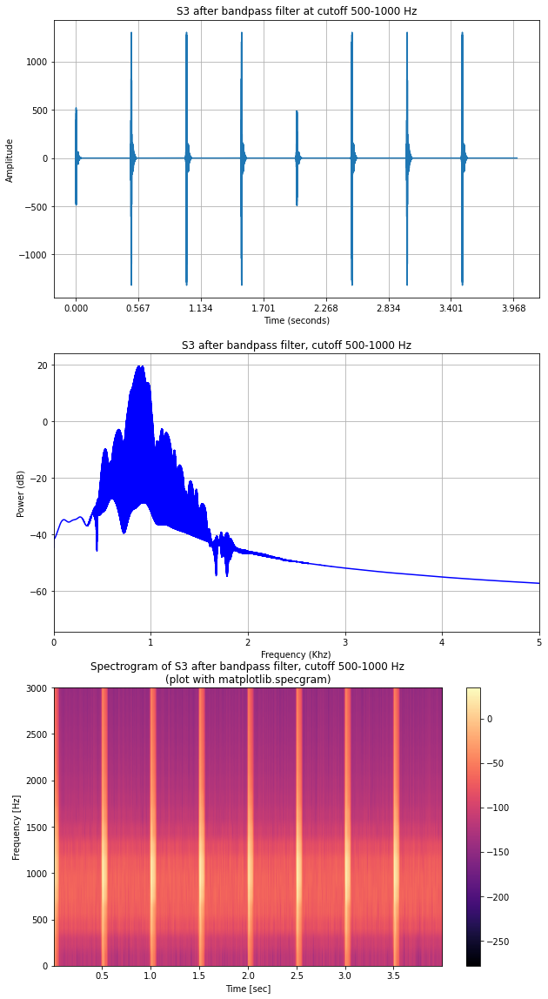

In [40]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SB3, rate, "S3 after bandpass filter at cutoff 500-1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SB3,rate, "S3 after bandpass filter, cutoff 500-1000 Hz", ax=plt.subplot(312))
plot_specgram(SB3, rate, 'Spectrogram of S3 after bandpass filter, cutoff 500-1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SB3, rate=rate))

In [44]:
# Highpass filter on signal S3
SH3 = apply_filter_on_signal(S3,rate, 1000, 4, "high")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


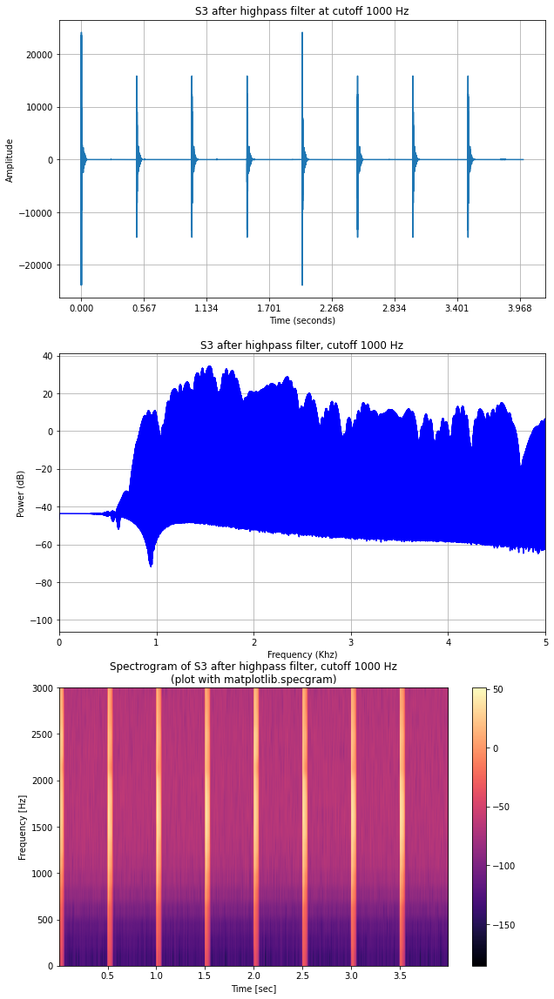

In [45]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SH3, rate, "S3 after highpass filter at cutoff 1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SH3,rate, "S3 after highpass filter, cutoff 1000 Hz", ax=plt.subplot(312))
plot_specgram(SH3, rate, 'Spectrogram of S3 after highpass filter, cutoff 1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SH3, rate=rate))

### B.4. Εφαρμογή των φίλτρων στο σήμα S4

In [46]:
# lowpass filter on signal 4
SL4 = apply_filter_on_signal(S4, rate, 500, 4, "low")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


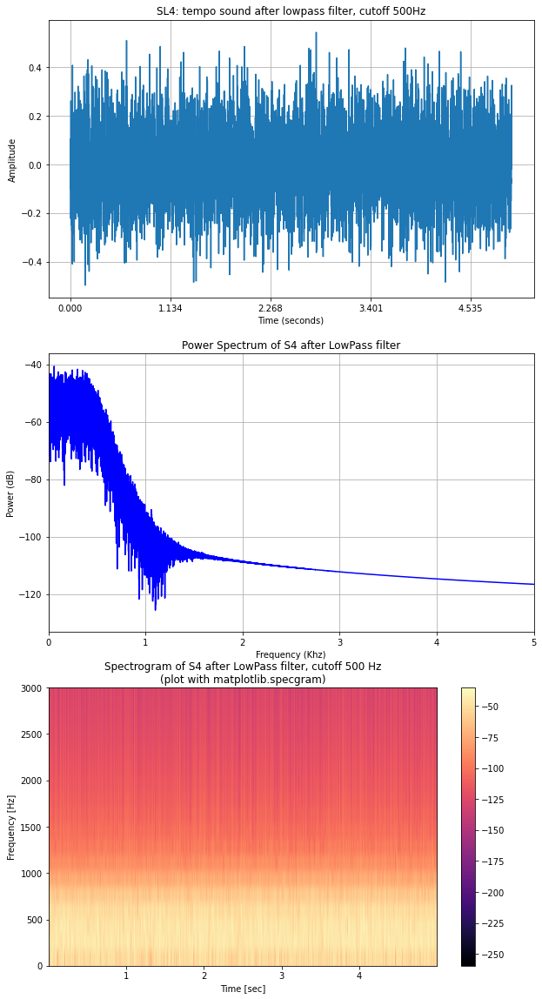

In [47]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SL4, rate, "SL4: tempo sound after lowpass filter, cutoff 500Hz", ax=plt.subplot(311))
plot_powerspectrum(SL4, rate, "Power Spectrum of S4 after LowPass filter", ax=plt.subplot(312))
plot_specgram(SL4, rate, 'Spectrogram of S4 after LowPass filter, cutoff 500 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SL4, rate=rate))

In [48]:
# bandpass filter on signal S4
SB4 = apply_filter_on_signal(S4,rate, [500, 1000], 4, "band")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


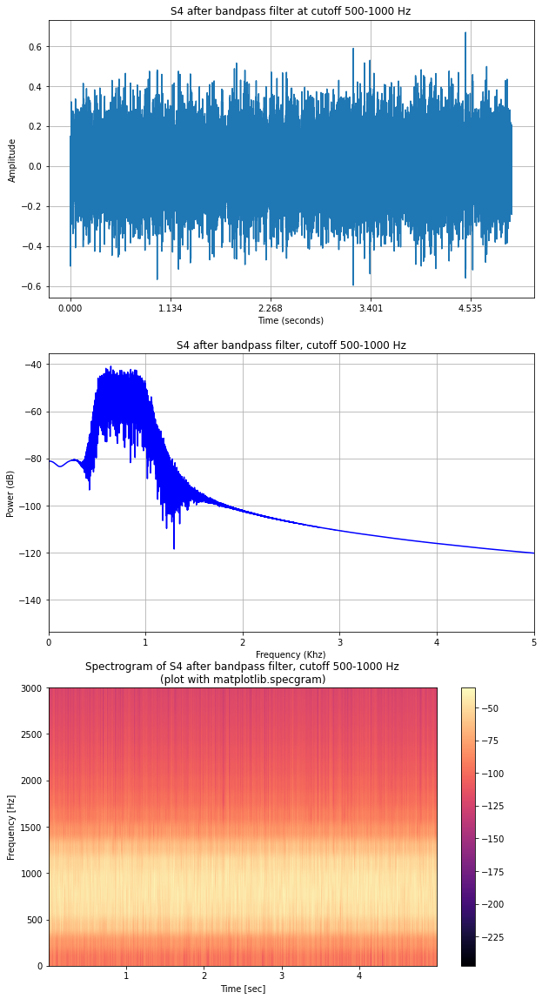

In [49]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SB4, rate, "S4 after bandpass filter at cutoff 500-1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SB4,rate, "S4 after bandpass filter, cutoff 500-1000 Hz", ax=plt.subplot(312))
plot_specgram(SB4, rate, 'Spectrogram of S4 after bandpass filter, cutoff 500-1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SB4, rate=rate))

In [50]:
# Highpass filter on signal S4
SH4 = apply_filter_on_signal(S4,rate, 1000, 4, "high")

/home/user/.local/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


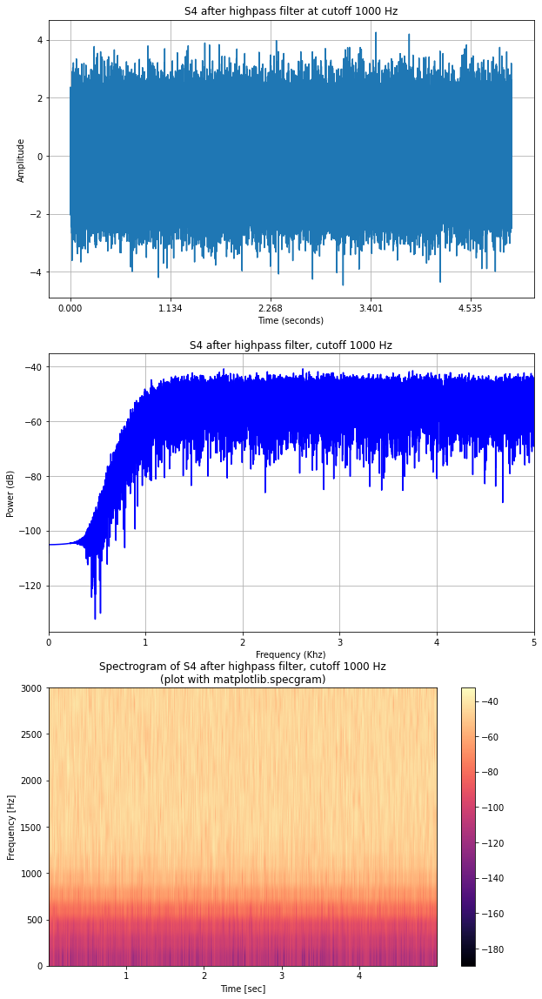

In [51]:
plt.figure(figsize=(10,20))
plot_signal_amplitude(SH4, rate, "S4 after highpass filter at cutoff 1000 Hz", ax=plt.subplot(311))
plot_powerspectrum(SH4,rate, "S4 after highpass filter, cutoff 1000 Hz", ax=plt.subplot(312))
plot_specgram(SH4, rate, 'Spectrogram of S4 after highpass filter, cutoff 1000 Hz', ax=plt.subplot(313))
ipd.display(ipd.Audio(data=SH4, rate=rate))